<a href="https://colab.research.google.com/github/jeanmarc2/Daily-Journal-Projects/blob/master/Dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd

In [2]:
import numpy as np

#🐶 End-to-End Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image
classification using TensorFlow 2.0 and TensorFlow Hub.


## 1. Problem

Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe ad i tae a photo of a dog, i want
to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification
competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each
dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probabli best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ image in the test set (these images have no labels, because we'll want to predict them)

## This is a Colab notebook

In [3]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/dog vision train/train.zip" -d "/content/drive/MyDrive/dog vision train/train"

In [4]:
# Unzip data in the drive
#!unzip "/content/drive/MyDrive/dog vision train/test.zip" -d "/content/drive/MyDrive/dog vision train/test"

# Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub
* Make sure we're using a GPU

In [5]:
# Import ncessary tools


import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

TF version: 2.17.0
TF Hub version: 0.16.1


In [6]:
# Check for GPU avalability
print("GPU", "available (YESSSSSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


## Getting our data ready (turning it into Tensors)

With all machine learning models, our data has to be in numrical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our dta and checking out the labels.

In [7]:
# Checkout the labels of our data
import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/dog vision train/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


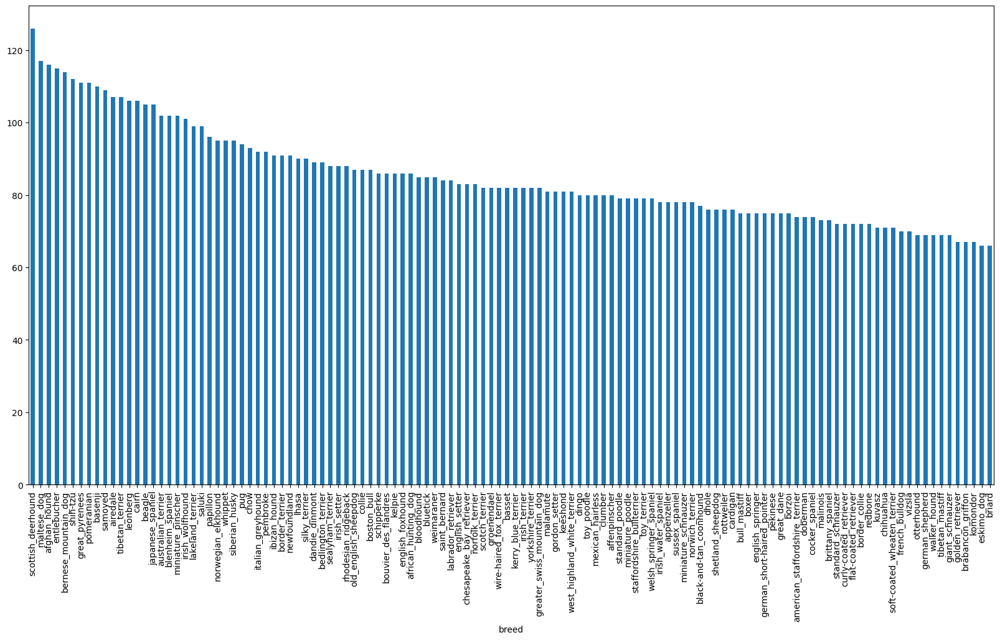

In [8]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [9]:
labels_csv["breed"].value_counts().median()

82.0

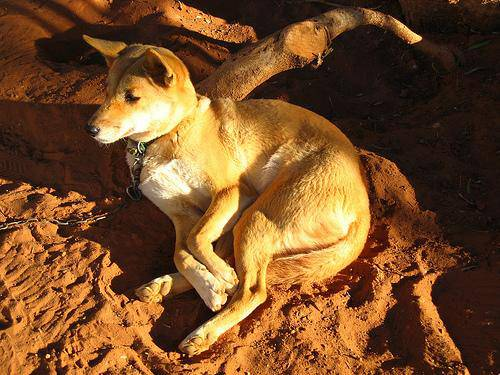

In [10]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog vision train/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##**Getting images and their labels**

Let's get a list of all our image image file pathnames

In [13]:
# Create pathnames from ID's
filenames = ["drive/MyDrive/dog vision train/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/dog vision train/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision train/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision train/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision train/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision train/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision train/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision train/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision train/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision train/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision train/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [14]:
# Check whether number of filnenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog vision train/train")) == len(filenames):
  print("filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the traget directory.")

filenames match actual amount of files!!! Proceed.


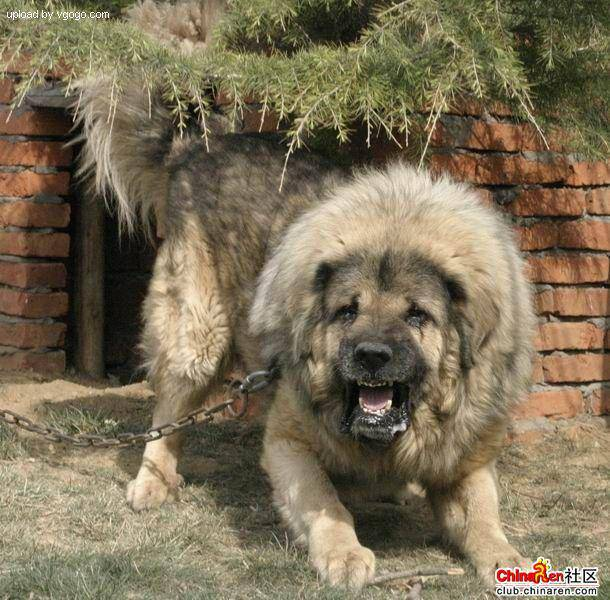

In [15]:
# One more check

Image(filenames[9000])

In [16]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in alist, let's prepare our labels.

In [17]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [18]:
len(labels)

10222

In [19]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels des nt match number of filenames, check data directories")

Number of labels matches number of filenames!


In [20]:
# Find the unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [21]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
len(boolean_labels)

10222

In [24]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set

Since the dataset from Kaglle doesn't come with a validation set, we're going to create our own.

In [25]:
# Setup X & y variables
x = filenames
y= boolean_labels

We're goint to start off experiment with -1000 images and increase as needed.

In [26]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [27]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [28]:
# Let's have ageez at the training data
x_train[:5], y_train[:2]

(['drive/MyDrive/dog vision train/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision train/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog vision train/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog vision train/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog vision train/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

Before we do, let's see what importing an image looks like.

In [29]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [30]:
image.max(), image.min()

(255, 0)

In [31]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like a as a Tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [32]:
IMG_SIZE = 224


# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the images into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colour channels (Read, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel; values from 0-255 to 0-1 values
  images = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## TURNING OUR DATA INTO BATCHES

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the bacth size) images at a time (you can manually adjust tyhe batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [33]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and return a tuple of (image,label).
  """
  image = process_image(image_path)
  return image, label


In [34]:
# Demo of the above
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 83.236534  , 133.1836    ,  82.436806  ],
         [ 64.697754  , 113.13456   ,  61.50028   ],
         [ 65.534386  , 113.91071   ,  60.929058  ],
         ...,
         [ 74.779015  , 132.34285   ,  81.996445  ],
         [ 75.79053   , 133.79053   ,  84.22733   ],
         [ 75.186874  , 133.18687   ,  85.186874  ]],
 
        [[ 66.05301   , 115.71407   ,  69.60177   ],
         [ 62.157993  , 112.378975  ,  65.146835  ],
         [ 72.39411   , 120.39411   ,  72.16197   ],
         ...,
         [ 71.0263    , 128.21379   ,  79.06201   ],
         [ 72.4933    , 130.27232   ,  82.935265  ],
         [ 73.49589   , 131.2749    ,  83.93785   ]],
 
        [[ 53.40004   , 103.76702   ,  65.770996  ],
         [ 61.31571   , 111.9474    ,  73.15723   ],
         [ 73.95284   , 122.240585  ,  82.23173   ],
         ...,
         [ 66.48884   , 123.45766   ,  76.8192    ],
         [ 69.10889   , 126.10889   ,  81.8455  

# Now we've got a way to turn our data into tuples of Tensors in the from: `(image,label)`, let's make a function to turn all of our data (X & y) into batches!

In [35]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a vladi dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                               tf.constant(y))) # labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [36]:
# Creating training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [37]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualization Data Batches

Our data is now in bacthes, however, these can be a little hard to understand/comprehend, let's visualize them.

In [38]:
import matplotlib.pyplot as plt

# Create a function viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the fiure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots (5rows, 5 colums)
    ax = plt.subplot(5, 5 ,i+1)
    # display an image
    plt.imshow(images[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

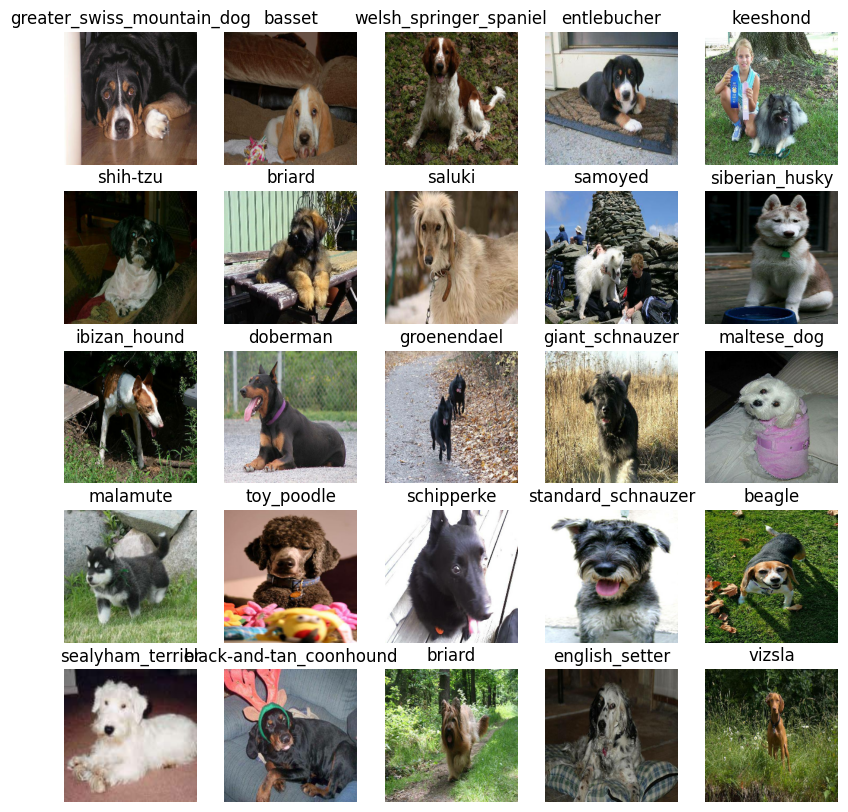

In [39]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images/255, train_labels)

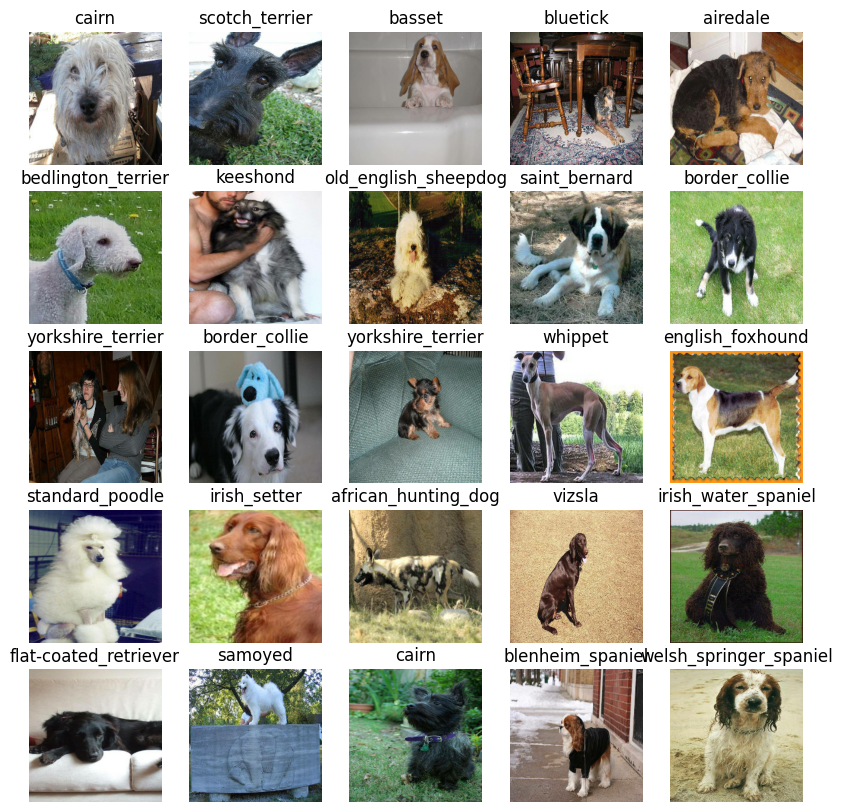

In [40]:
# Now let's visualize our validation sets
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images/255, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
& The URL of the model we want to use.

In [41]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels
# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the inpout shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Karas model in sequentials fashion (do this first, then this, thena that).
* Compiles the model (says it should be evaluated and improved).
* Build the model (tells the model the input shape it'll be getting).
* Returns the model.

In [42]:
# Create a function which builds a Keras model
import tf_keras as keras

def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url = MODEL_URL):
  print("building model with:", MODEL_URL)

  #Setup the model layers
  model = keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)
  return model

In [43]:
model = create_model()
model.summary()

building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [44]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helpert functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helos track our models progress and another for early stopping which prevents ourt model from training for too long

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensoprBoard notebook extension
2. Create a TensorBoard callback which is able to save logs
to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [45]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [46]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs.
  logdir = os.path.join("drive/MyDrive/dog vision train/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [47]:
## Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everthing is working

In [48]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [49]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


Let's create a function which trains a model.

* Create a model using `Create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [50]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and return the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

In [51]:
# Fit the model to the data
#model = train_model()

## Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will acces the logs directory we created earlier and visualize its contents.

In [52]:
%tensorboard --logdir  "drive/MyDrive/dog vision train/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [53]:
# Make predictions on the validtion data (not used to train on)
#predictions = model.predict(val_data, verbose=1)
#predictions

7/7 [==============================] - 731s 121s/step


array([[4.91413753e-04, 1.88033795e-04, 9.23501153e-04, ...,
        1.50630809e-03, 3.28546315e-02, 3.13362479e-03],
       [1.88988284e-03, 3.19658546e-04, 1.04122784e-03, ...,
        3.66733707e-02, 3.23007330e-02, 4.56255133e-04],
       [3.97666736e-05, 8.09268822e-05, 1.92078587e-03, ...,
        2.59591755e-03, 3.41714509e-02, 1.46461141e-04],
       ...,
       [1.60711224e-03, 3.38450918e-04, 1.87063275e-03, ...,
        2.30115233e-03, 1.10270018e-02, 1.01795606e-02],
       [2.44133465e-04, 9.85163031e-04, 1.37103678e-04, ...,
        3.72121902e-03, 2.92825047e-03, 1.73032749e-02],
       [7.76742876e-04, 1.86612684e-04, 7.69437640e-04, ...,
        1.15716802e-02, 1.03143575e-02, 3.70364549e-04]], dtype=float32)

In [54]:
predictions.shape

(200, 120)

In [55]:
len(y_val)

200

In [56]:
len(unique_breeds)

120

In [57]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.9141375e-04 1.8803379e-04 9.2350115e-04 6.2162214e-04 4.1278452e-03
 1.5943329e-04 7.0361263e-04 1.0304453e-03 1.9498383e-04 2.1725120e-02
 7.3067739e-04 2.2875397e-03 4.8812076e-02 2.3522165e-02 2.4966279e-02
 1.8946537e-03 7.2567149e-05 5.9581553e-03 4.4395533e-04 4.0615089e-02
 4.9429567e-04 9.6574659e-03 3.4728860e-03 4.9218576e-04 2.8216827e-03
 3.5392723e-04 2.5120378e-03 3.8655982e-03 5.4971181e-04 1.6371399e-03
 8.1132544e-04 3.3537339e-04 3.6129783e-04 6.9230428e-04 1.8659772e-04
 9.5591665e-04 1.2592952e-03 1.5371505e-02 5.0244445e-04 3.4724623e-03
 2.9802369e-04 1.3418154e-04 1.4616738e-04 3.1688851e-03 4.1922457e-03
 1.0794505e-04 8.6628905e-05 1.6444867e-03 5.4723644e-03 9.4560832e-03
 2.4105813e-05 1.1786418e-04 9.7941514e-04 3.7604969e-03 2.5450252e-03
 4.0083915e-01 6.7633606e-04 4.5549398e-04 2.3789269e-04 4.7822641e-03
 3.1270182e-03 7.9443939e-03 1.0943606e-03 1.6793940e-03 1.7456045e-02
 2.1151936e-04 1.4747004e-03 8.1739051e-04 3.3758964e-02 1.7199627e-03
 8.872

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels

In [58]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[3])
pred_label

'ibizan_hound'

Now since our validation data is still in a batch dataset,
we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [59]:
# Create a function to unbacth a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[ 75.479095, 110.37641 ,  77.94561 ],
         [ 67.92136 ,  84.14216 ,  58.25859 ],
         [ 80.14246 ,  70.63859 ,  58.48398 ],
         ...,
         [197.91655 , 209.91655 , 206.59067 ],
         [207.29243 , 211.27643 , 214.37706 ],
         [209.33705 , 210.72528 , 214.80351 ]],
 
        [[ 59.794205,  80.589386,  49.836975],
         [ 87.078445,  93.23014 ,  69.466835],
         [114.79099 , 102.29858 ,  86.60974 ],
         ...,
         [195.43166 , 207.4205  , 207.44461 ],
         [186.25832 , 191.28064 , 195.30635 ],
         [190.02322 , 193.80655 , 199.68561 ]],
 
        [[ 76.902245,  78.605965,  53.59674 ],
         [ 74.10182 ,  69.01879 ,  46.922813],
         [105.527054,  92.2354  ,  75.582115],
         ...,
         [203.67262 , 214.67262 , 219.46428 ],
         [202.9223  , 211.29283 , 219.44418 ],
         [191.71315 , 198.65767 , 207.959   ]],
 
        ...,
 
        [[248.54286 , 251.91335 , 238.2281  ],
         [252.84027 , 254.41876 , 240.410

In [60]:
get_pred_label(val_labels[0])

'affenpinscher'

In [61]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[ 75.479095, 110.37641 ,  77.94561 ],
         [ 67.92136 ,  84.14216 ,  58.25859 ],
         [ 80.14246 ,  70.63859 ,  58.48398 ],
         ...,
         [197.91655 , 209.91655 , 206.59067 ],
         [207.29243 , 211.27643 , 214.37706 ],
         [209.33705 , 210.72528 , 214.80351 ]],
 
        [[ 59.794205,  80.589386,  49.836975],
         [ 87.078445,  93.23014 ,  69.466835],
         [114.79099 , 102.29858 ,  86.60974 ],
         ...,
         [195.43166 , 207.4205  , 207.44461 ],
         [186.25832 , 191.28064 , 195.30635 ],
         [190.02322 , 193.80655 , 199.68561 ]],
 
        [[ 76.902245,  78.605965,  53.59674 ],
         [ 74.10182 ,  69.01879 ,  46.922813],
         [105.527054,  92.2354  ,  75.582115],
         ...,
         [203.67262 , 214.67262 , 219.46428 ],
         [202.9223  , 211.29283 , 219.44418 ],
         [191.71315 , 198.65767 , 207.959   ]],
 
        ...,
 
        [[248.54286 , 251.91335 , 238.2281  ],
         [252.84027 , 254.41876 , 240.410

In [62]:
get_pred_label(labels_[0])

'cairn'

In [63]:
get_pred_label(predictions[0])

'ibizan_hound'

Now we've got ways to get :
  * Prediction labels
  * Validation labels (truth labels)
  * Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers. ✔
* Convert the prediction probabilities to a predicted label. ✔
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✔


In [64]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


In [65]:
val_images_scaled = [image / 255.0 for image in val_images]

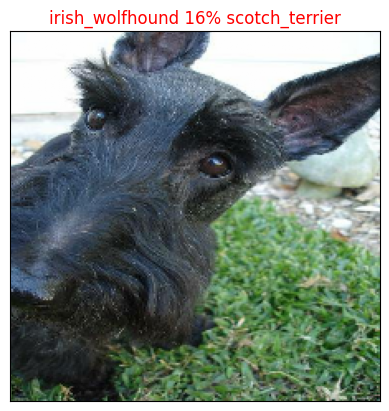

In [66]:
plot_pred(prediction_probabilities= predictions,
          labels =val_labels,
          images =val_images_scaled)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 prediction.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✔
* Find the prediction using `get_pred_label()` ✔
* Find the top 10:
  * Prediction probabilities indexes ✔
  * Prediction probabilities values ✔
  * Prediction labels ✔
* Plot the top 10 prediction probability values and labels, coloring the true label green ✔

In [67]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the  top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color ="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation= "vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


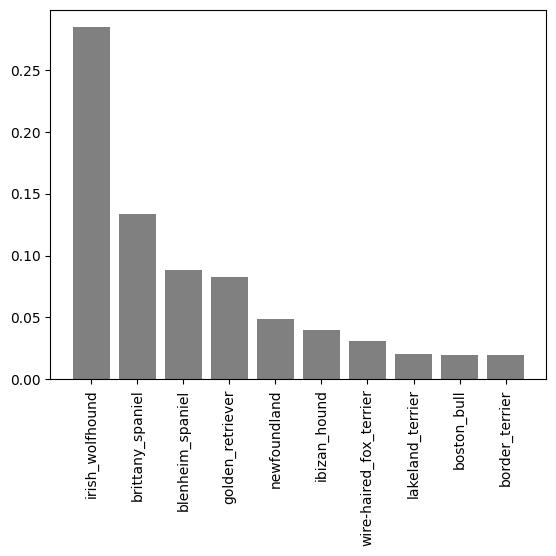

In [68]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

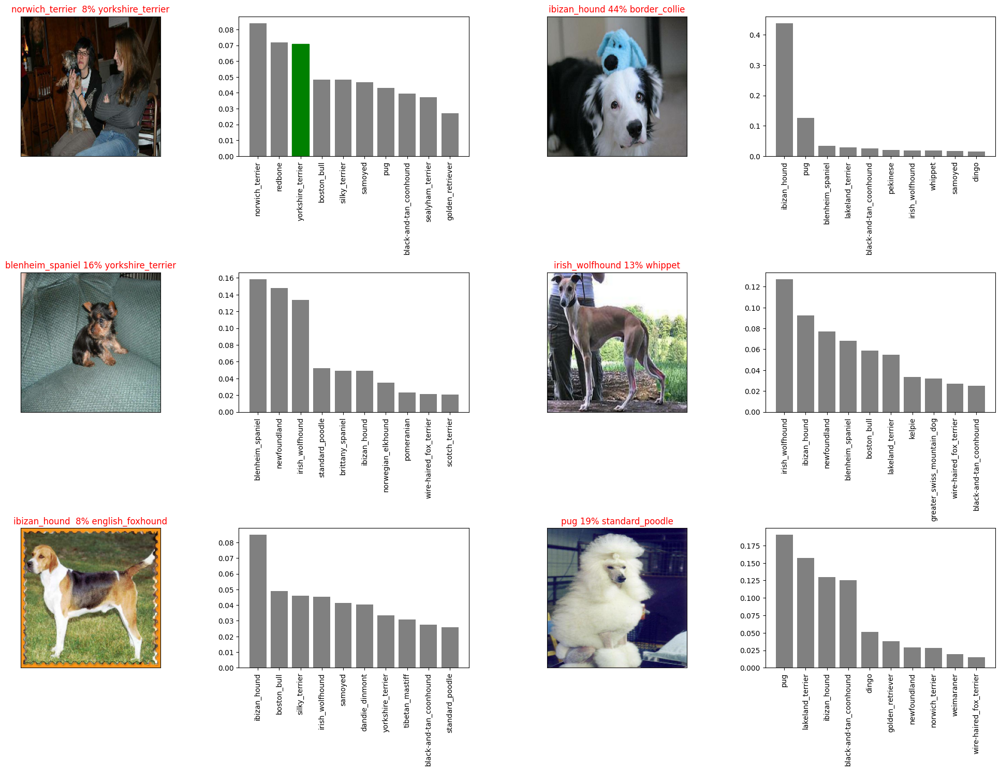

In [69]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities= predictions,
            labels = val_labels,
            images=val_images_scaled,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


** Challenge** How would you create a confusion matrix with our models predictions nd true labels?

##Saving and reloading a trained model

In [70]:
# Create a function to save a model
def save_model (model, suffix=None):
  """
  Saves a given model in a models directiry and appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/dog vision train/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [71]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """

  print(f"Loading saved model from: {model_path}")
  model = keras.models.load_model(model_path,
                                  custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and laod a trained model, let's make sure they work!

In [72]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog vision train/models/20241007-13251728307547-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog vision train/models/20241007-13251728307547-1000-images-mobilenetv2-Adam.h5'

In [73]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/dog vision train/models/20241004-15331728056025-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/dog vision train/models/20241004-15331728056025-1000-images-mobilenetv2-Adam.h5


In [74]:
# Evaluate the pre-save model
model.evaluate(val_data)

7/7 [==============================] - 15s 2s/step - loss: 6.4217 - accuracy: 0.0050


[6.42171573638916, 0.004999999888241291]

In [75]:
# Evaluate the loading model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 6.3980 - accuracy: 0.0050


[6.397951602935791, 0.004999999888241291]

## Training a nig dog model (on the full data)

In [76]:
len(x), len(y)

(10222, 10222)

In [77]:
x[:10]

['drive/MyDrive/dog vision train/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision train/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision train/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision train/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision train/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision train/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision train/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision train/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision train/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision train/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [78]:
len(x_train)

800

In [79]:
# Create a data batch with the full data set
full_data = create_data_batches(x, y)

Creating training data batches...


In [80]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [81]:
# Create a model for full model
full_model = create_model()

building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [82]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                          patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [83]:
# Fit the full model to the full data
#full_model.fit(x=full_data,
               #epochs=NUM_EPOCHS,
               #callbacks=[full_model_tensorboard, full_model_early_stopping])

In [84]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog vision train/models/20241007-13261728307588-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/dog vision train/models/20241007-13261728307588-full-image-set-mobilenetv2-Adam.h5'

In [85]:
# Load in the full model
loaded_full_model= load_model("/content/drive/MyDrive/dog vision train/models/20241004-17541728064469-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/dog vision train/models/20241004-17541728064469-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form Tensor batches, to make a predictions on the test data, we'll have to get it intyo the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and cover them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames ✔
* Convert the filenames into test data bacthes using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).✔
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [86]:
# Load test image filenames
test_path = "/content/drive/MyDrive/dog vision train/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision train/test/e73efb021b7b49e328b2159d34060b82.jpg',
 '/content/drive/MyDrive/dog vision train/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 '/content/drive/MyDrive/dog vision train/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 '/content/drive/MyDrive/dog vision train/test/e726ac27864ecbde1f5822c4d6e26c17.jpg',
 '/content/drive/MyDrive/dog vision train/test/e702ddff98bd0b05ab200ffb43fb080a.jpg',
 '/content/drive/MyDrive/dog vision train/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/dog vision train/test/e6da14858db7781843db6af91551f627.jpg',
 '/content/drive/MyDrive/dog vision train/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 '/content/drive/MyDrive/dog vision train/test/e715a411098c046cac90c3facfa58c77.jpg',
 '/content/drive/MyDrive/dog vision train/test/e71fde4ddc4c1adf9b4cf397e3904f74.jpg']

In [87]:
# Create test data bacth
test_data = create_data_batches(test_filenames, test_data=True)

Creating test batches...


In [88]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an -1hr).
on my computer it took more than 1hr, it took about 3+

In [89]:
# Make predictions on test data batch using the loaded full model
#test_predictions = loaded_full_model.predict(test_data,
                                           # verbose=1)

In [90]:
# Save predictions (Numpy array) to csv file(for acces later)
#np.savetxt("drive/MyDrive/dog vision train/preds_array.csv", test_predictions, delimiter=",")

In [91]:
# Load predictions (Numpy array ) from csv file
test_predictions = np.loadtxt("drive/MyDrive/dog vision train/preds_array.csv", delimiter=",")

In [93]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Loking at the Kaggle sample submission, we find it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.


To get the data in this format, we'll:
* Create a pandas DataFrame with and ID column as well as a column for each dog breed✔
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breeds columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [94]:
# Create a pandas DataFrame with empty columns
#preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
#preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test images ID's to predictions DataFrame
#test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
#preds_df["id"] = test_ids

In [96]:
#preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e73efb021b7b49e328b2159d34060b82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e743bea73da2c0dab99ccdbc697b1ac8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e726ac27864ecbde1f5822c4d6e26c17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e702ddff98bd0b05ab200ffb43fb080a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
# Add the prediction probabilities to each dog breed column
#preds_df[list(unique_breeds)] = test_predictions
#preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e73efb021b7b49e328b2159d34060b82,1.614686e-04,1.791153e-06,8.562100e-07,1.634688e-04,1.092035e-03,3.778747e-03,3.414943e-05,2.891567e-04,2.188084e-04,...,4.070328e-05,4.973807e-02,1.352296e-04,9.672636e-04,6.164257e-02,3.144764e-08,5.095791e-05,1.847983e-05,0.000013,2.048350e-03
1,e7be7b911a4cba9fdfa4105ec4776370,3.120629e-03,1.286855e-03,1.638868e-07,7.527848e-03,1.820081e-02,1.105603e-02,2.568081e-02,2.383943e-03,1.217995e-04,...,5.962040e-03,4.500751e-03,3.088249e-07,1.257193e-04,2.009342e-03,3.288812e-06,2.002889e-06,5.452800e-06,0.001621,7.624345e-03
2,e743bea73da2c0dab99ccdbc697b1ac8,5.566929e-05,2.561869e-03,2.522810e-03,3.044046e-02,4.616683e-05,1.184863e-07,1.310437e-04,1.952664e-02,1.988918e-03,...,1.906222e-05,3.379928e-05,1.461947e-02,7.137591e-05,6.857759e-04,9.920940e-05,6.859970e-03,5.223545e-07,0.001998,8.675875e-07
3,e726ac27864ecbde1f5822c4d6e26c17,1.653561e-07,2.217761e-08,1.171067e-09,6.976718e-11,1.708473e-11,2.086217e-08,8.659705e-12,1.528932e-11,2.826006e-09,...,8.880387e-14,9.494618e-09,2.490287e-16,3.628412e-14,2.670876e-10,7.385809e-15,5.127570e-14,2.205007e-07,0.004184,1.594433e-06
4,e702ddff98bd0b05ab200ffb43fb080a,3.155769e-02,9.710253e-04,5.142065e-05,2.322472e-01,2.772894e-05,4.317038e-04,3.597637e-03,1.429211e-03,3.459661e-05,...,7.440321e-05,1.064661e-05,1.446649e-08,2.652746e-04,2.574130e-07,6.244619e-05,9.805594e-09,5.383819e-07,0.000069,6.190416e-04


In [98]:
# Save our predictions dataframe to CSV for submission to Kaggle
#preds_df.to_csv("drive/MyDrive/dog vision train/ fulle_model_predictions_submission_1_mobileneteV2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_bacthes()`. And since our custom images won't have labels, we set `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [102]:
# get custom image filepaths
custom_path = "drive/MyDrive/dog vision train/dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [103]:
custom_image_paths

['drive/MyDrive/dog vision train/dog-photos/download (1).jpeg',
 'drive/MyDrive/dog vision train/dog-photos/download (2).jpeg',
 'drive/MyDrive/dog vision train/dog-photos/download.jpeg']

In [105]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [107]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [108]:
custom_preds.shape

(3, 120)

In [110]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['airedale', 'greater_swiss_mountain_dog', 'beagle']

In [113]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images= []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image/255.0)

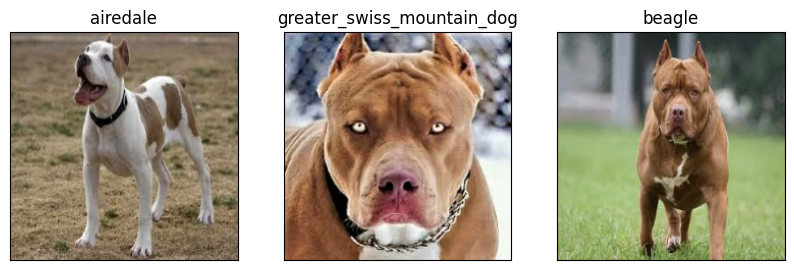

In [114]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)